In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots

In [2]:
df = pd.read_csv("Customer_Data.csv")
df.head()

,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [3]:
df.shape

(8950, 18)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   cust_id                           8950 non-null   object 
 1   balance                           8950 non-null   float64
 2   balance_frequency                 8950 non-null   float64
 3   purchases                         8950 non-null   float64
 4   oneoff_purchases                  8950 non-null   float64
 5   installments_purchases            8950 non-null   float64
 6   cash_advance                      8950 non-null   float64
 7   purchases_frequency               8950 non-null   float64
 8   oneoff_purchases_frequency        8950 non-null   float64
 9   purchases_installments_frequency  8950 non-null   float64
 10  cash_advance_frequency            8950 non-null   float64
 11  cash_advance_trx                  8950 non-null   int64  
 12  purcha

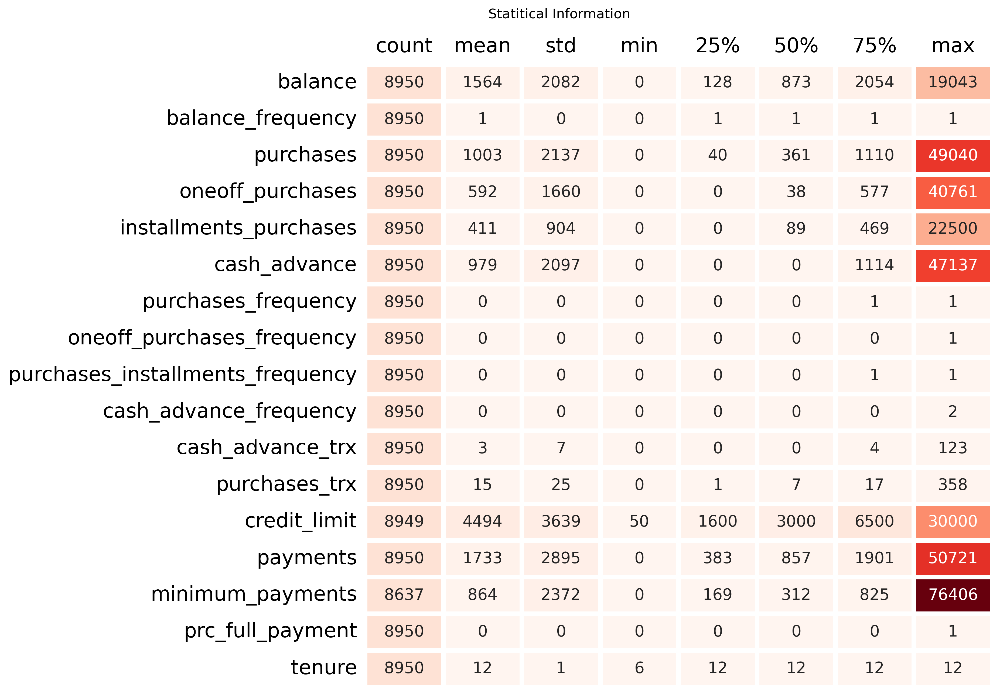

In [5]:
desc_cust = df.select_dtypes(include=['int64','float64']).describe().T
desc_cust_df = pd.DataFrame(index=desc_cust.index, columns=desc_cust.columns, data=desc_cust )

f,ax = plt.subplots(figsize=(10,10),dpi=300)

sns.heatmap(desc_cust_df, annot=True,cmap = "Reds", fmt= '.0f',
            ax=ax,linewidths = 4, cbar = False,
            annot_kws={"size": 14})

ax.xaxis.set_ticks_position('top')
plt.tick_params(left=False, top=False)
plt.xticks(size = 18)
plt.yticks(size = 18)
plt.title("Statitical Information", pad=30, x=0.31, y=1.02)
plt.show()

In [6]:
df = df.drop('cust_id', axis=1)

In [7]:
for col in df:
    print(col, df[col].isnull().sum())

balance 0
balance_frequency 0
purchases 0
oneoff_purchases 0
installments_purchases 0
cash_advance 0
purchases_frequency 0
oneoff_purchases_frequency 0
purchases_installments_frequency 0
cash_advance_frequency 0
cash_advance_trx 0
purchases_trx 0
credit_limit 1
payments 0
minimum_payments 313
prc_full_payment 0
tenure 0


In [8]:
df[df.credit_limit.isna()]

,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
5203,18.400472,0.166667,0.0,0.0,0.0,186.853063,0.0,0.0,0.0,0.166667,1,0,NaN,9.040017,14.418723,0.0,6


In [9]:
df = df.drop(df[df.credit_limit.isna()].index, axis=0)

In [10]:
from sklearn.impute import KNNImputer

In [11]:
imputer = KNNImputer()
imputer.fit(df)

df1 = pd.DataFrame(imputer.transform(df),columns=df.columns)

# Print result
print(f'Missing (before): {df.isna().sum().sum()}')
print(f'Missing (after): {df1.isna().sum().sum()}')   

Missing (before): 313
Missing (after): 0


In [12]:
print(f"Number of dupilcated data: {df1.duplicated().sum()}")

Number of dupilcated data: 0


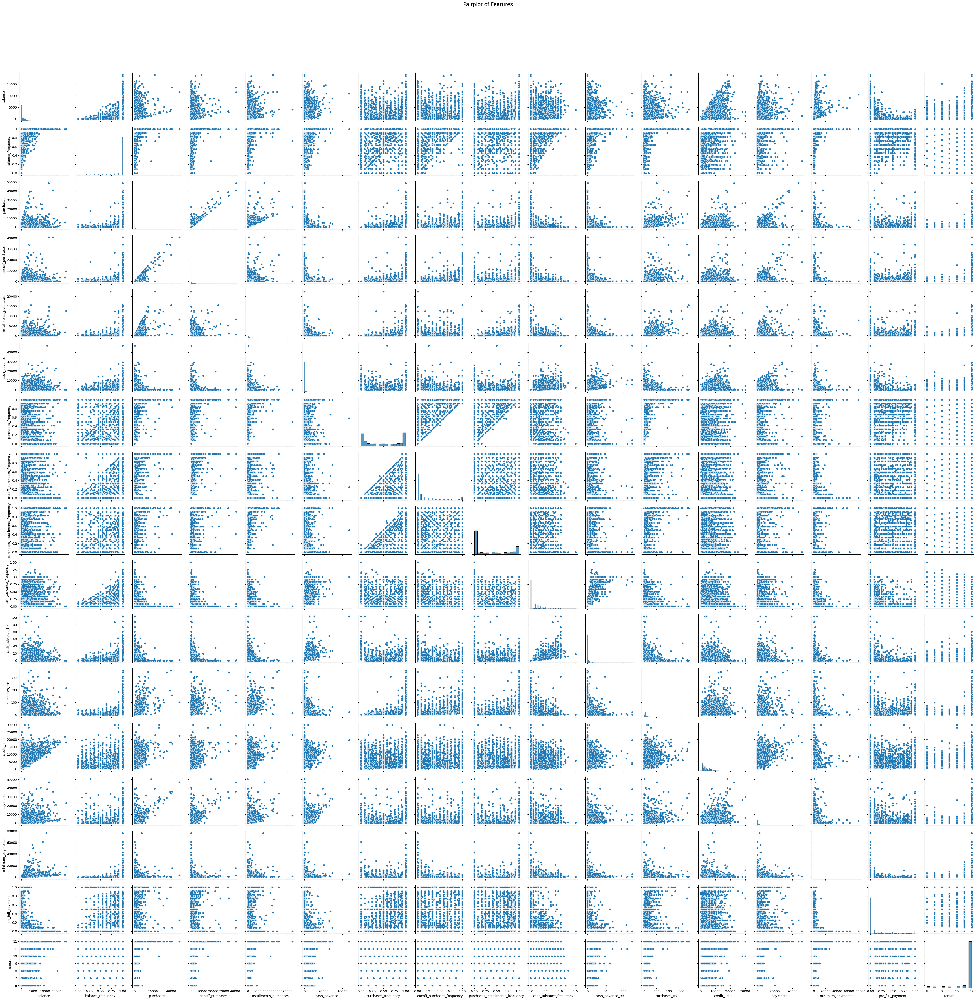

In [13]:
pplot = sns.pairplot(df1)
pplot.fig.suptitle("Pairplot of Features", y=1.02, fontsize=16)
pplot.fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()



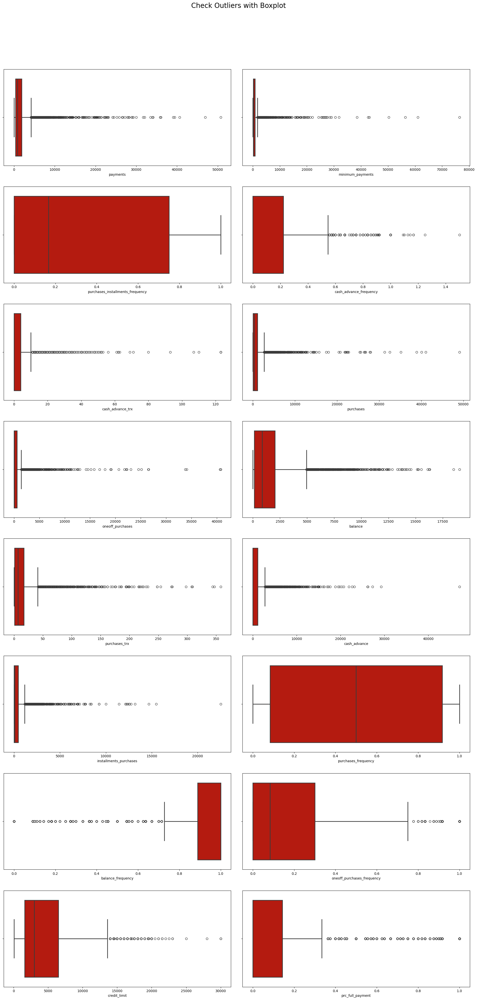

In [14]:
fig, ax = plt.subplots(8, 2, figsize=(20, 40))

for i, col in enumerate(set(df1.columns) - {'tenure'}):
    sns.boxplot(data=df1, x=col, color="#B41B10", saturation=1, linewidth=2, ax=ax[i // 2, i % 2])

fig.suptitle("Check Outliers with Boxplot", y=1.02, fontsize=20)
fig.tight_layout(pad=3.0, rect=[0, 0, 1, 0.98])

plt.show()



## Univariate Analysis


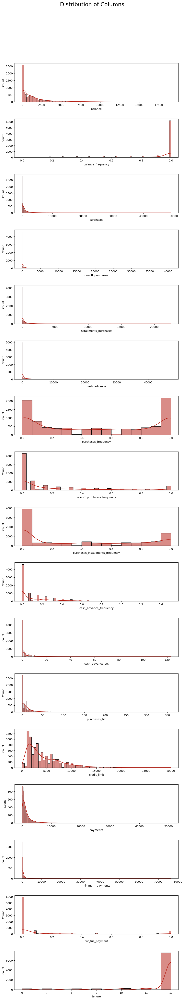

In [15]:

fig, ax = plt.subplots(17, 1, figsize=(10, 50))

for i, col in enumerate(df1.columns):
    sns.histplot(df1[col], kde=True, ax=ax[i], color="#B41B10")

fig.suptitle('Distribution of Columns', y=1.02, fontsize=20)
fig.tight_layout(pad=3.0, rect=[0, 0, 1, 0.98])

plt.show()


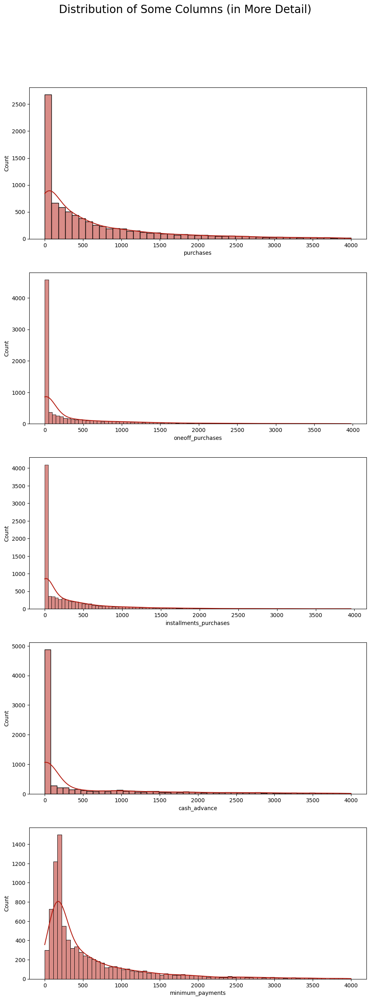

In [16]:
cols = ['purchases', 'oneoff_purchases', 'installments_purchases', 'cash_advance', 'minimum_payments']
fig, ax = plt.subplots(5, 1, figsize=(10, 25))

for i, col in enumerate(cols):
    sns.histplot(df1[df1[col] < 4000][col], kde=True, ax=ax[i], color="#B41B10")

fig.suptitle('Distribution of Some Columns (in More Detail)', y=1.02, fontsize=20)
fig.tight_layout(pad=3.0, rect=[0, 0, 1, 0.98])

plt.show()


## Bivariate Analysis

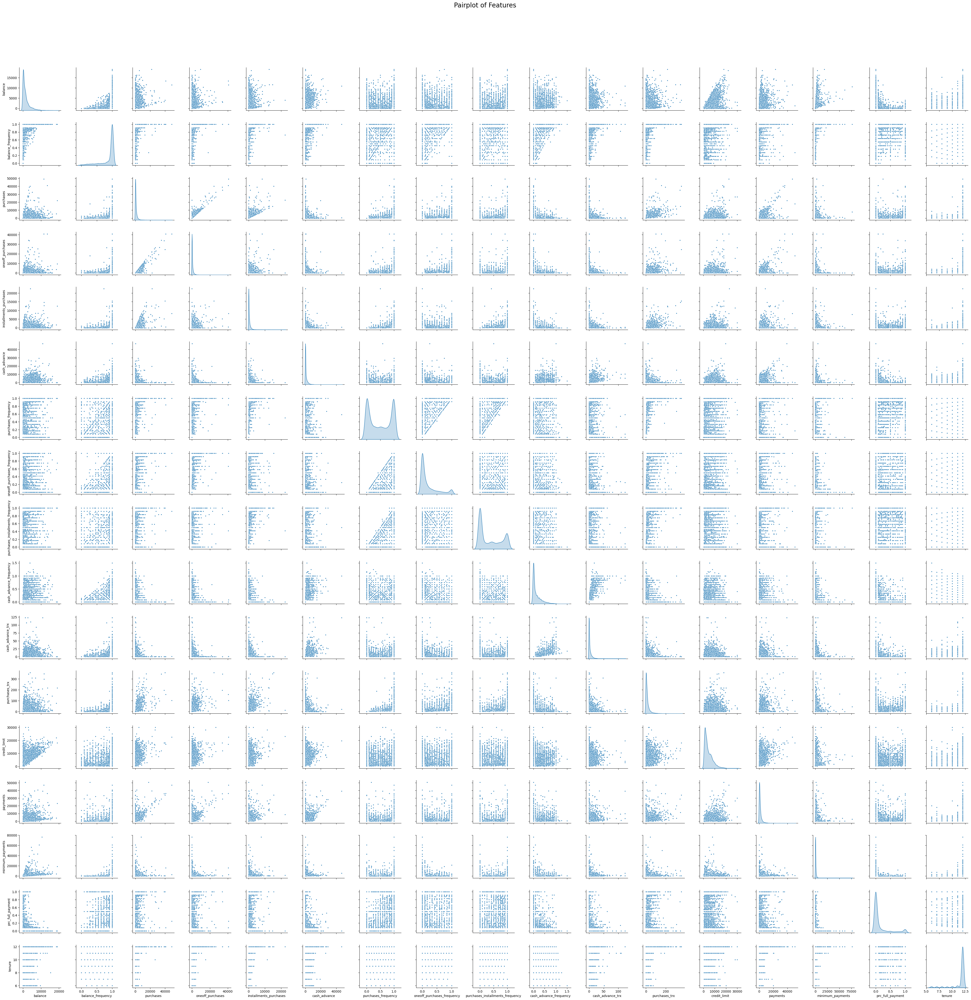

In [17]:
pplot = sns.pairplot(df1, markers='.', diag_kind="kde")

pplot.fig.suptitle("Pairplot of Features", y=1.02, fontsize=20)
pplot.fig.tight_layout(pad=3.0, rect=[0, 0, 1, 0.98])

plt.show()


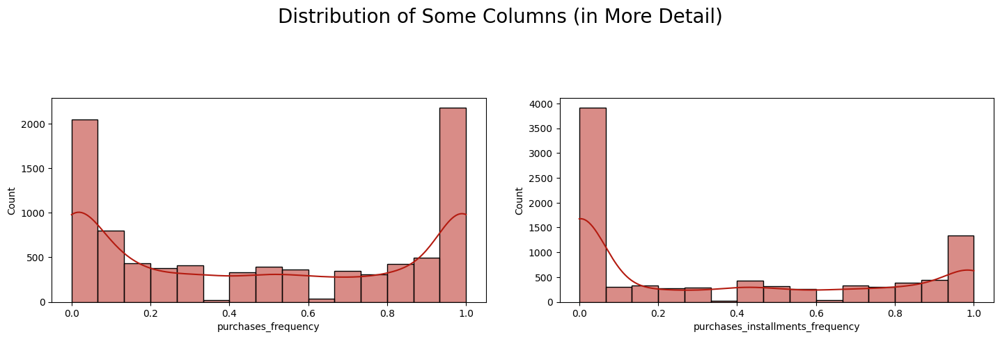

In [18]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5), dpi=100)

for i, col in enumerate(['purchases_frequency', 'purchases_installments_frequency']):
    sns.histplot(df1[col], kde=True, color="#B41B10", ax=ax[i])

fig.suptitle('Distribution of Some Columns (in More Detail)', y=1.02, fontsize=20)
fig.tight_layout(pad=3.0, rect=[0, 0, 1, 0.98])

plt.show()


## Multivariate Analysis

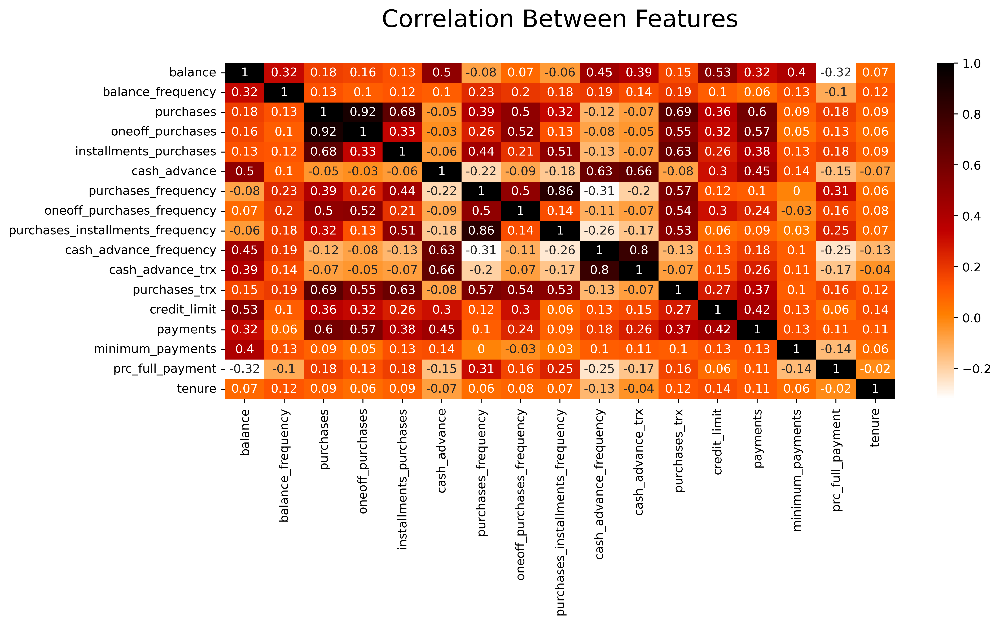

In [19]:
plt.figure(figsize=(13, 8), dpi=500)
sns.heatmap(df.corr().round(2), annot=True, cmap='gist_heat_r')

plt.title("Correlation Between Features", pad=30, fontsize=20)
plt.tight_layout(pad=3.0, rect=[0, 0, 1, 0.98])

plt.show()


As can be seen, each customer's balance is more correlated with cash_advance and credit_limit. Also, the purchases of each customer have the highest correlation with oneoff_purchases, purchases_trx, installments_purchases and payments.

## Model Building

In [20]:
from sklearn.preprocessing import StandardScaler

In [21]:
scaler = StandardScaler().fit(df1)
df_trans = scaler.transform(df1)
df2 = pd.DataFrame(df_trans, columns = df1.columns)
df2.head()

,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
0,-0.732054,-0.249881,-0.424934,-0.356957,-0.349114,-0.466805,-0.806649,-0.678716,-0.707409,-0.675294,-0.476083,-0.511381,-0.960380,-0.529026,-0.303869,-0.525588,0.360541
1,0.786858,0.134049,-0.469584,-0.356957,-0.454607,2.605438,-1.221928,-0.678716,-0.917090,0.573949,0.110032,-0.591841,0.688601,0.818546,0.093483,0.234159,0.360541
2,0.447041,0.517980,-0.107716,0.108843,-0.454607,-0.466805,1.269742,2.673295,-0.917090,-0.675294,-0.476083,-0.109082,0.826016,-0.383857,-0.096095,-0.525588,0.360541
3,0.049015,-1.017743,0.231995,0.546123,-0.454607,-0.368678,-1.014290,-0.399383,-0.917090,-0.258882,-0.329554,-0.551611,0.826016,-0.598733,-0.201502,-0.525588,0.360541
4,-0.358849,0.517980,-0.462095,-0.347317,-0.454607,-0.466805,-1.014290,-0.399383,-0.917090,-0.675294,-0.476083,-0.551611,-0.905414,-0.364421,-0.259023,-0.525588,0.360541


In [22]:
from sklearn.cluster import KMeans, MiniBatchKMeans, MeanShift, estimate_bandwidth, AffinityPropagation, Birch, DBSCAN, OPTICS, AgglomerativeClustering 
from yellowbrick.cluster import KElbowVisualizer
import scipy.cluster.hierarchy as sch
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from sklearn.model_selection import GridSearchCV
from sklearn import set_config
from sklearn.metrics import silhouette_score, calinski_harabasz_score


In [23]:
try:
    from kneed import KneeLocator
except:
    !pip install kneed
    from kneed import KneeLocator

In [24]:
# Kmeans algorithm settings
kmeans_set = {"init":"random", "n_init":10, "max_iter":300, "random_state":42}
# Find inertia for k cluster
inertias = []
for k in range(1,11):
    kmeans = KMeans(n_clusters=k, **kmeans_set)
    kmeans.fit(df2)
    inertias.append(kmeans.inertia_)

In [25]:
def elbow_optimizer(inertias, name):
    """ Find the optimal k for the clustering algorithm
        inertias (list): List containing inertia values for each selected k
        name (string): Name of the clustering algorithm
    """

    kl = KneeLocator(range(1, 11), inertias, curve='convex', direction="decreasing")
    plt.figure(figsize=(10, 6))  # Add figsize for better readability
    sns.lineplot(x=range(1, 11), y=inertias, color="#B41B10")
    plt.xticks(range(1, 11))
    plt.xlabel("Number of Clusters", labelpad=20)
    plt.ylabel("Inertia", labelpad=20)
    plt.title(f"Elbow Method for {name}", y=1.02, fontsize=20)
    plt.axvline(x=kl.elbow, color="#1f77b4", linestyle='--', label='Optimal k')
    plt.legend()
    plt.tight_layout(pad=3.0, rect=[0, 0, 1, 0.98])
    plt.show()


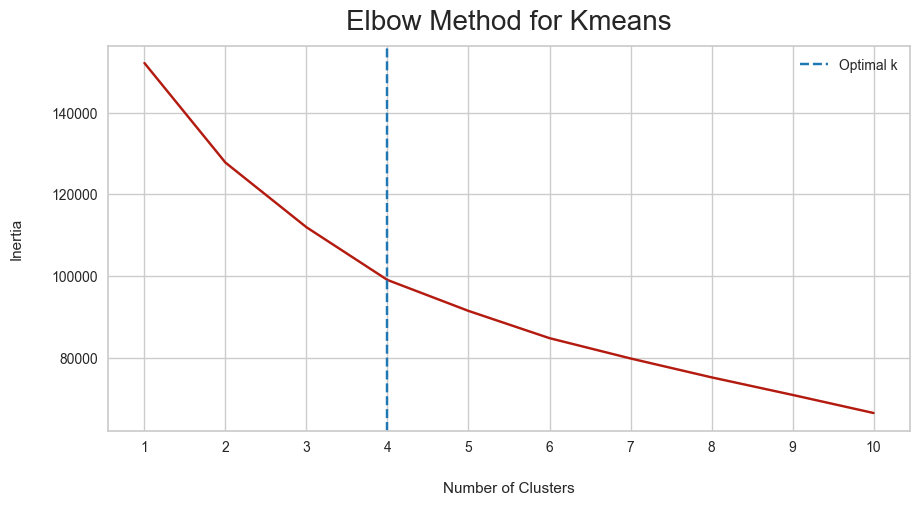

In [26]:
elbow_optimizer(inertias, 'Kmeans')

In [27]:
silhouette_coef = []
for k in range(2,11):
    kmeans = KMeans(n_clusters=k, **kmeans_set)
    kmeans.fit(df2)
    score = silhouette_score(df2, kmeans.labels_)
    silhouette_coef.append(score)

calinski_harabasz_coef = []
for k in range(2,11):
    kmeans = KMeans(n_clusters=k, **kmeans_set)
    kmeans.fit(df2)
    score = calinski_harabasz_score(df2, kmeans.labels_)
    calinski_harabasz_coef.append(score)


In [28]:
def plot_evaluation(sh_score, ch_score, name, x=range(2, 11)):
    """
    Draw evaluation plots including silhouette_score and calinski_harabasz_score.
    
    sh_score (list): Silhouette scores of models
    ch_score (list): Calinski-Harabasz scores of models
    name (string): Name of the clustering algorithm
    x (list): Range of numbers for the x-axis
    """
    
    fig, ax = plt.subplots(1, 2, figsize=(15, 7), dpi=100)
    ax[0].plot(x, sh_score, color="#B41B10", marker='o', markersize=9, markerfacecolor="#1f77b4")
    ax[1].plot(x, ch_score, color="#B41B10", marker='o', markersize=9, markerfacecolor="#1f77b4")
    
    ax[0].set_xlabel("Number of Clusters", labelpad=20)
    ax[0].set_ylabel("Silhouette Coefficient", labelpad=20)
    ax[1].set_xlabel("Number of Clusters", labelpad=20)
    ax[1].set_ylabel("Calinski-Harabasz Coefficient", labelpad=20)
    
    plt.suptitle(f'Evaluate {name} Clustering', y=0.95, fontsize=20)
    plt.tight_layout(pad=3.0, rect=[0, 0, 1, 0.98])
    plt.show()


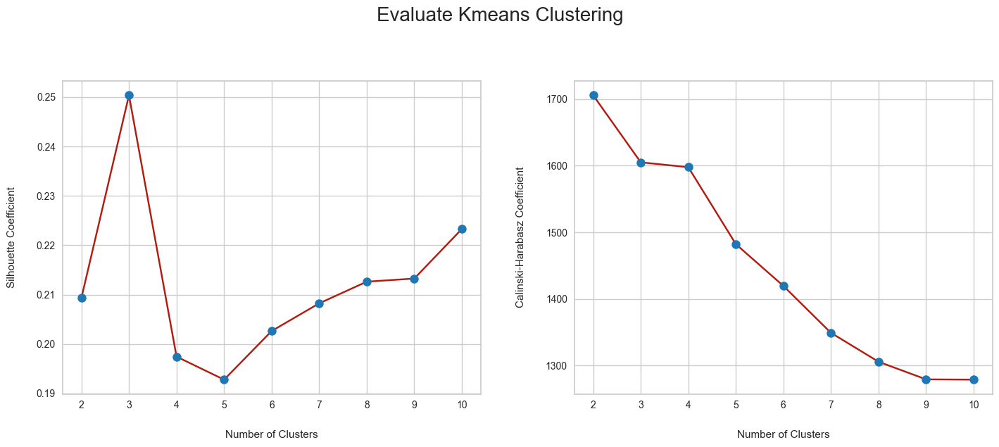

In [29]:
plot_evaluation(silhouette_coef, calinski_harabasz_coef, 'Kmeans')

In [30]:
best_model = pd.DataFrame({'Model':[], 'Sil_score':[], 'CH_score':[], 'setting':[]})

In [31]:
kmeans = KMeans(n_clusters=3, **kmeans_set).fit(df2)
# Store result of kmeans
pred = kmeans.labels_
# Store the coordinates of centroids
centroids = kmeans.cluster_centers_
centroids = pd.DataFrame(data=centroids, columns = [df2.columns])
centroids.T

,0,1,2
balance,1.160011,-0.367912,0.320891
balance_frequency,0.340476,-0.177617,0.439627
purchases,-0.290818,-0.232544,1.530810
oneoff_purchases,-0.207778,-0.204159,1.282302
installments_purchases,-0.305974,-0.174667,1.263333
cash_advance,1.375841,-0.309932,-0.246645
purchases_frequency,-0.645652,-0.061557,1.142692
oneoff_purchases_frequency,-0.307883,-0.234303,1.561670
purchases_installments_frequency,-0.556275,-0.047265,0.955880
cash_advance_frequency,1.557422,-0.334909,-0.358217


In [32]:
best_model.loc[len(best_model.index)] = [
    f"Kmeans",
    silhouette_score(df2, pred),
    calinski_harabasz_score(df2, pred),
    {"n_clusters":3, **kmeans_set}]

In [33]:
real_centroids = scaler.inverse_transform(centroids)
real_centroids = pd.DataFrame(data=real_centroids, columns = [df2.columns])
real_centroids.T

,0,1,2
balance,3979.172732,798.851218,2232.571946
balance_frequency,0.957970,0.835293,0.981447
purchases,381.953483,506.461378,4274.059521
oneoff_purchases,247.617849,253.624731,2720.965977
installments_purchases,134.412977,253.157549,1553.580162
cash_advance,3864.301368,328.985622,461.708571
purchases_frequency,0.231281,0.465700,0.949010
oneoff_purchases_frequency,0.110630,0.132581,0.668371
purchases_installments_frequency,0.143398,0.345694,0.744373
cash_advance_frequency,0.446814,0.068118,0.063454


In [34]:
df_result_kmeans = pd.concat([df1, pd.DataFrame(pred, columns=['cluster'])], axis = 1)
df_result_kmeans

,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0.0,2.0,1000.0,201.802084,139.509787,0.000000,12.0,1
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4.0,0.0,7000.0,4103.032597,1072.340217,0.222222,12.0,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0.0,12.0,7500.0,622.066742,627.284787,0.000000,12.0,1
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1.0,1.0,7500.0,0.000000,379.829982,0.000000,12.0,1
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0.0,1.0,1200.0,678.334763,244.791237,0.000000,12.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,325.594462,48.886365,0.500000,6.0,1
8945,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,275.861322,156.060050,0.000000,6.0,1
8946,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0.0,5.0,1000.0,81.270775,82.418369,0.250000,6.0,1
8947,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2.0,0.0,500.0,52.549959,55.755628,0.250000,6.0,1


In [36]:
from itertools import product

In [37]:
eps_values = np.arange(1,15,2) # eps values to be investigated
min_samples = np.arange(20,41,10) # min_samples values to be investigated

DBSCAN_params = list(product(eps_values, min_samples))

In [38]:
silhouette_coef = []
num_of_clusters = []
for param in DBSCAN_params:
    dbscan = DBSCAN(eps=param[0], min_samples=param[1])
    dbscan.fit(df2)
    score = silhouette_score(df2, dbscan.labels_)
    silhouette_coef.append(score)
    # for check number of clusters
    num_of_clusters.append(len(np.unique(dbscan.labels_)))

calinski_harabasz_coef = []
for param in DBSCAN_params:
    dbscan = DBSCAN(eps=param[0], min_samples=param[1])
    dbscan.fit(df2)
    score = calinski_harabasz_score(df2, dbscan.labels_)
    calinski_harabasz_coef.append(score)

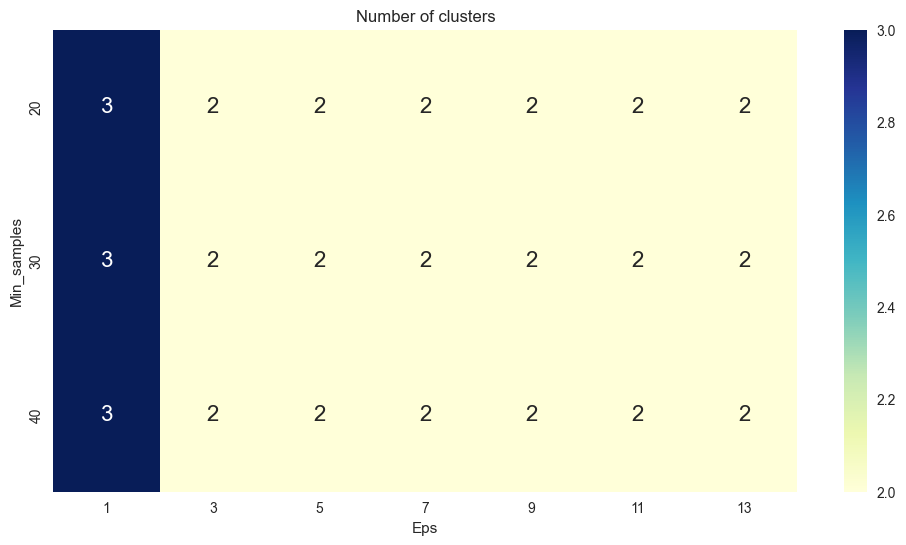

In [39]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])   
tmp['No_of_clusters'] = num_of_clusters

pivot_1 = pd.pivot_table(tmp, values='No_of_clusters', index='Min_samples', columns='Eps')

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(pivot_1, annot=True,annot_kws={"size": 16}, cmap="YlGnBu", ax=ax)
ax.set_title('Number of clusters')
plt.show()

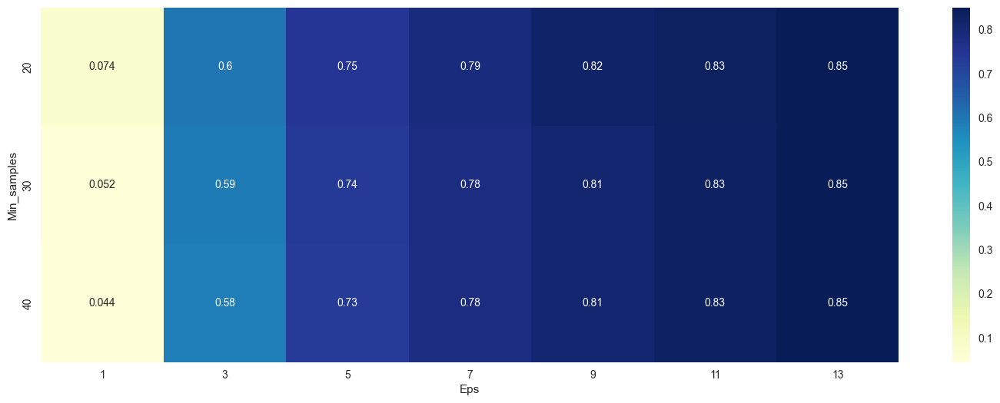

In [40]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])   
tmp['Sil_score'] = silhouette_coef

pivot_1 = pd.pivot_table(tmp, values='Sil_score', index='Min_samples', columns='Eps')

fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_1, annot=True, annot_kws={"size": 10}, cmap="YlGnBu", ax=ax)
plt.show()

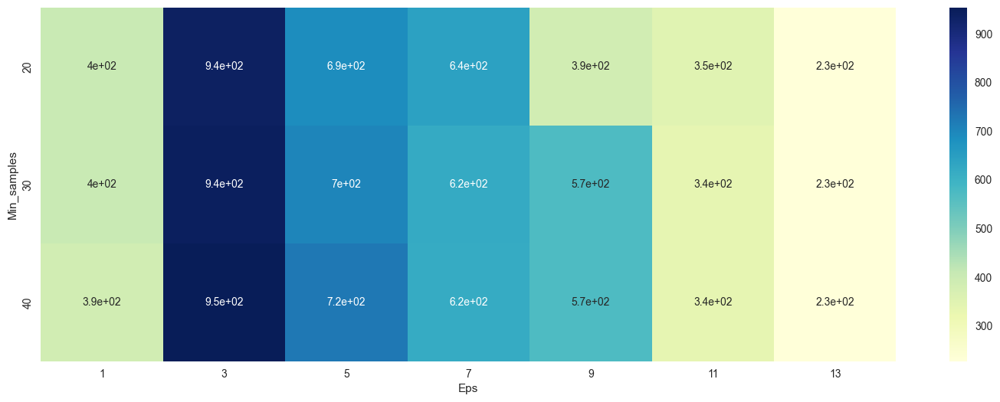

In [41]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])   
tmp['CH_score'] = calinski_harabasz_coef

pivot_1 = pd.pivot_table(tmp, values='CH_score', index='Min_samples', columns='Eps')

fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_1, annot=True, annot_kws={"size": 10}, cmap="YlGnBu", ax=ax)
plt.show()

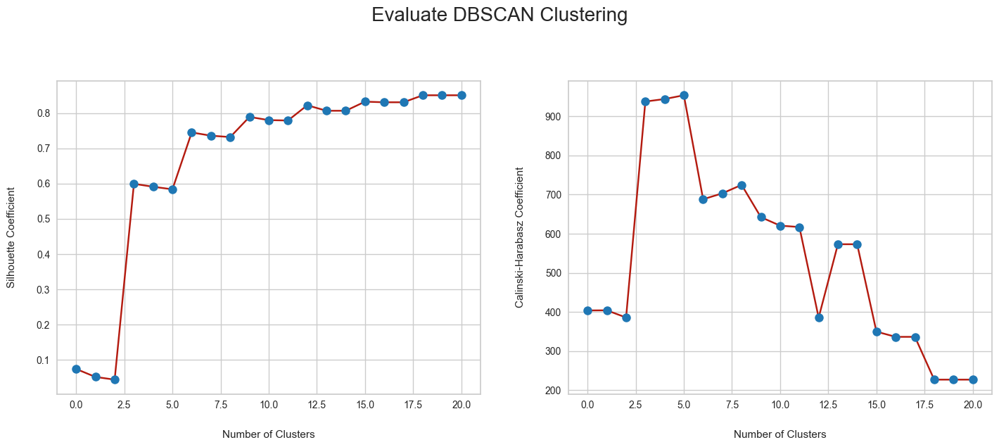

In [42]:
plot_evaluation(silhouette_coef, calinski_harabasz_coef, 'DBSCAN', x=range(len(DBSCAN_params)))

In [43]:
dbscan = DBSCAN(eps=3.5, min_samples=40)
dbscan.fit(df2)
# Store result of DBSCAN
pred = dbscan.labels_
# Number of cluster
num_of_clusters = len(np.unique(pred))
# Evaluate results of mean shift by silhouette and calinski coefficient
sh_score = silhouette_score(df2, pred)
ch_score = calinski_harabasz_score(df2, pred)
# Print results
print(f"Number of cluster: {np.unique(pred)}")
print(f"Silhouette Coefficient: {sh_score:.2f}")
print(f"Calinski Harabasz Coefficient: {ch_score:.2f}")

Number of cluster: [-1  0]
Silhouette Coefficient: 0.63
Calinski Harabasz Coefficient: 894.06


In [44]:
best_model.loc[len(best_model.index)] = [
    f"DBSCAN",
    silhouette_score(df2, pred),
    calinski_harabasz_score(df2, pred),
    {"eps":3.5, "min_samples":40}]

In [45]:
def dendoOptimizer(data):
    """Plots a Dendogram Plot on the data provided"""
    sch.dendrogram(sch.linkage(data, method='ward'))
    plt.title('Dendrogram')
    plt.xlabel('Customers')
    plt.ylabel('Euclidean distances')
    plt.show()

In [ ]:
dendoOptimizer(df2)

In [46]:
silhouette_coef = []
for k in range(2,15):
    agg = AgglomerativeClustering(n_clusters=k)
    agg.fit(df2)
    score = silhouette_score(df2, agg.fit_predict(df2))
    silhouette_coef.append(score)

calinski_harabasz_coef = []
for k in range(2,15):
    agg = AgglomerativeClustering(n_clusters=k)
    agg.fit(df2)
    score = calinski_harabasz_score(df2, agg.fit_predict(df2))
    calinski_harabasz_coef.append(score)

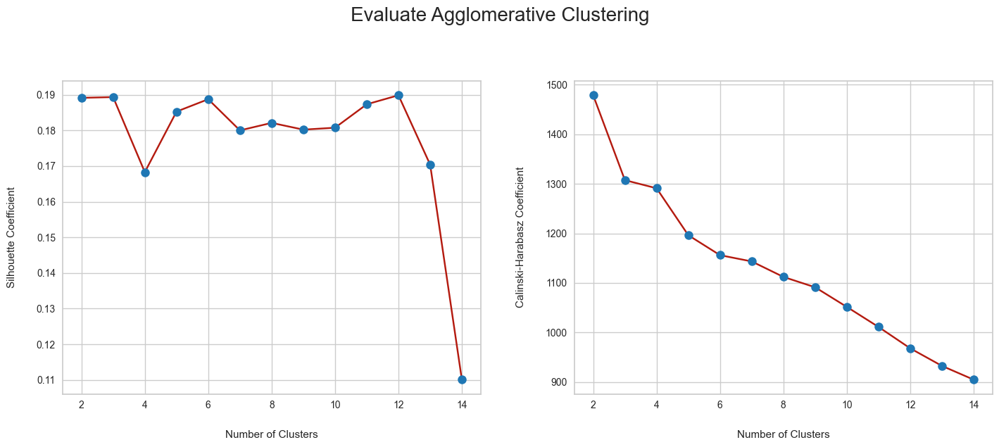

In [47]:
plot_evaluation(silhouette_coef, calinski_harabasz_coef, 'Agglomerative', x=range(2,15))


In [48]:
agg = AgglomerativeClustering(n_clusters=2)
agg.fit(df2)
# Store result of Agglomerative
pred = agg.labels_
# Evaluate results of mean shift by silhouette and calinski coefficient
sh_score = silhouette_score(df2, pred)
ch_score = calinski_harabasz_score(df2, pred)
# Print results
print(f"Silhouette Coefficient: {sh_score:.2f}")
print(f"Calinski Harabasz Coefficient: {ch_score:.2f}")
# Adding the clusters column to the main dataframe (df2) and store in new dataframe
df_result_agg = pd.concat([df1, pd.DataFrame(pred, columns=['cluster'])], axis = 1)
df_result_agg

Silhouette Coefficient: 0.19
Calinski Harabasz Coefficient: 1478.76


,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0.0,2.0,1000.0,201.802084,139.509787,0.000000,12.0,0
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4.0,0.0,7000.0,4103.032597,1072.340217,0.222222,12.0,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0.0,12.0,7500.0,622.066742,627.284787,0.000000,12.0,1
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1.0,1.0,7500.0,0.000000,379.829982,0.000000,12.0,0
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0.0,1.0,1200.0,678.334763,244.791237,0.000000,12.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,325.594462,48.886365,0.500000,6.0,0
8945,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,275.861322,156.060050,0.000000,6.0,0
8946,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0.0,5.0,1000.0,81.270775,82.418369,0.250000,6.0,0
8947,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2.0,0.0,500.0,52.549959,55.755628,0.250000,6.0,0


In [49]:
best_model.loc[len(best_model.index)] = [
    f"Agglomerative",
    silhouette_score(df2, pred),
    calinski_harabasz_score(df2, pred),
    {"n_clusters":2}]

In [50]:
best_model

,Model,Sil_score,CH_score,setting
0,Kmeans,0.250369,1605.165157,"{'n_clusters': 3, 'init': 'random', 'n_init': ..."
1,DBSCAN,0.630633,894.056713,"{'eps': 3.5, 'min_samples': 40}"
2,Agglomerative,0.189152,1478.757090,{'n_clusters': 2}
